In [203]:
import pandas as pd
import numpy as np
from matplotlib import  pyplot as plt
%matplotlib inline

import seaborn as sns
from sklearn.model_selection import train_test_split

In [204]:
data = pd.read_csv('h1n1_features.csv')

In [205]:
data.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [206]:
data.shape

(26707, 36)

In [207]:
labels = pd.read_csv('h1n1_labels.csv')
labels.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,0,0,0
1,1,0,1
2,2,0,0
3,3,0,1
4,4,0,0


In [208]:
data_df = pd.concat([data, labels], axis=1)
data_df.drop('respondent_id',axis=1, inplace=True)

In [209]:
pd.set_option('display.max_columns', None)
data_df.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [210]:
data_df.shape

(26707, 37)

In [211]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 37 columns):
h1n1_concern                   26615 non-null float64
h1n1_knowledge                 26591 non-null float64
behavioral_antiviral_meds      26636 non-null float64
behavioral_avoidance           26499 non-null float64
behavioral_face_mask           26688 non-null float64
behavioral_wash_hands          26665 non-null float64
behavioral_large_gatherings    26620 non-null float64
behavioral_outside_home        26625 non-null float64
behavioral_touch_face          26579 non-null float64
doctor_recc_h1n1               24547 non-null float64
doctor_recc_seasonal           24547 non-null float64
chronic_med_condition          25736 non-null float64
child_under_6_months           25887 non-null float64
health_worker                  25903 non-null float64
health_insurance               14433 non-null float64
opinion_h1n1_vacc_effective    26316 non-null float64
opinion_h1n1_risk          

In [212]:
data_df.dtypes.value_counts()

float64    23
object     12
int64       2
dtype: int64

### Missing Values

In [213]:
data_df.isna().sum()

h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
marital_status                  1408
r

In [214]:
null_sum = data_df.isnull().sum()
total = null_sum.sort_values(ascending=False)
percent = (((null_sum / len(data_df))*100).round(2)).sort_values(ascending=False)
#percent = ( ((missing['total'] / len(data)*100).round(2) ).sort_values(ascending=False)
    
# concatenate along the columns 
df_Null = pd.concat([total, percent], axis=1, keys=['Number of NaN', 'Percent NaN'])

In [215]:
df_Null.head(31)

,Number of NaN,Percent NaN
employment_occupation,13470,50.44
employment_industry,13330,49.91
health_insurance,12274,45.96
income_poverty,4423,16.56
doctor_recc_seasonal,2160,8.09
doctor_recc_h1n1,2160,8.09
rent_or_own,2042,7.65
employment_status,1463,5.48
marital_status,1408,5.27
education,1407,5.27


In [216]:
mis_val_columns = df_Null[
            df_Null.iloc[:,1] != 0]

In [217]:
 print ("The dataframe has " + str(data_df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_columns.shape[0]) +" columns that have missing values.")

The dataframe has 37 columns.
There are 30 columns that have missing values.


In [218]:
#employment_occupation
data_df['employment_occupation'].value_counts(dropna=False)

NaN         13470
xtkaffoo     1778
mxkfnird     1509
emcorrxb     1270
cmhcxjea     1247
xgwztkwe     1082
hfxkjkmi      766
qxajmpny      548
xqwwgdyp      485
kldqjyjy      469
uqqtjvyb      452
tfqavkke      388
ukymxvdu      372
vlluhbov      354
oijqvulv      344
ccgxvspp      341
bxpfxfdn      331
haliazsg      296
rcertsgn      276
xzmlyyjv      248
dlvbwzss      227
hodpvpew      208
dcjcmpih      148
pvmttkik       98
Name: employment_occupation, dtype: int64

In [219]:
data_df[['employment_occupation','employment_status','employment_industry']]

,employment_occupation,employment_status,employment_industry
0,NaN,Not in Labor Force,NaN
1,xgwztkwe,Employed,pxcmvdjn
2,xtkaffoo,Employed,rucpziij
3,NaN,Not in Labor Force,NaN
4,emcorrxb,Employed,wxleyezf
5,vlluhbov,Employed,saaquncn
6,xtkaffoo,Employed,xicduogh
7,xqwwgdyp,Employed,pxcmvdjn
8,ccgxvspp,Employed,xicduogh
9,NaN,Not in Labor Force,NaN


In [220]:
#table[(table.column_name == some_value) | (table.column_name2 == some_value2)]
df_employ_null = data_df[(data_df['employment_occupation'] == np.NaN) | (data_df['employment_status'] == 'Not in Labor Force')]

In [221]:
pd.set_option('display.max_rows', None)
df_employ_null[['employment_occupation','employment_status','employment_industry','health_insurance']]

,employment_occupation,employment_status,employment_industry,health_insurance
0,NaN,Not in Labor Force,NaN,1.0
3,NaN,Not in Labor Force,NaN,NaN
9,NaN,Not in Labor Force,NaN,1.0
12,NaN,Not in Labor Force,NaN,1.0
14,NaN,Not in Labor Force,NaN,1.0
16,NaN,Not in Labor Force,NaN,1.0
19,NaN,Not in Labor Force,NaN,1.0
20,NaN,Not in Labor Force,NaN,NaN
23,NaN,Not in Labor Force,NaN,0.0
27,NaN,Not in Labor Force,NaN,NaN


In [222]:
len(df_employ_null)

10231

In [223]:
data_df['employment_occupation'].value_counts(dropna=False)

NaN         13470
xtkaffoo     1778
mxkfnird     1509
emcorrxb     1270
cmhcxjea     1247
xgwztkwe     1082
hfxkjkmi      766
qxajmpny      548
xqwwgdyp      485
kldqjyjy      469
uqqtjvyb      452
tfqavkke      388
ukymxvdu      372
vlluhbov      354
oijqvulv      344
ccgxvspp      341
bxpfxfdn      331
haliazsg      296
rcertsgn      276
xzmlyyjv      248
dlvbwzss      227
hodpvpew      208
dcjcmpih      148
pvmttkik       98
Name: employment_occupation, dtype: int64

#### health insurance

In [224]:
#health insurance
#Most of NaNs are not in labor force so probabily don't have health insurance
data_df['health_insurance'].value_counts(dropna=False)

1.0    12697
NaN    12274
0.0     1736
Name: health_insurance, dtype: int64

In [225]:
data_df['health_insurance'].fillna(0, inplace=True)

In [226]:
#df_data['health_insurance'].isna().sum()
data_df['health_insurance'].value_counts(dropna=False)

0.0    14010
1.0    12697
Name: health_insurance, dtype: int64

#### employment_occupation

In [227]:
#health_insurance = done
#employment_occupation / NaN  = 'Not in Labor Force'
#employment_industry / NaN = 'Not in Labor Force'
#health_insurance / NaN = 0
data_df["employment_occupation"].fillna("Not in Labor Force", inplace = True) 
data_df["employment_industry"].fillna("Not in Labor Force", inplace = True) 

In [228]:
data_df[["employment_occupation","employment_industry","health_insurance"]].isna().sum()

employment_occupation    0
employment_industry      0
health_insurance         0
dtype: int64

In [229]:
data_df["employment_occupation"].value_counts()

Not in Labor Force    13470
xtkaffoo               1778
mxkfnird               1509
emcorrxb               1270
cmhcxjea               1247
xgwztkwe               1082
hfxkjkmi                766
qxajmpny                548
xqwwgdyp                485
kldqjyjy                469
uqqtjvyb                452
tfqavkke                388
ukymxvdu                372
vlluhbov                354
oijqvulv                344
ccgxvspp                341
bxpfxfdn                331
haliazsg                296
rcertsgn                276
xzmlyyjv                248
dlvbwzss                227
hodpvpew                208
dcjcmpih                148
pvmttkik                 98
Name: employment_occupation, dtype: int64

#### income poverty

In [230]:
#income poverty
data_df['income_poverty'].value_counts(dropna=False)

<= $75,000, Above Poverty    12777
> $75,000                     6810
NaN                           4423
Below Poverty                 2697
Name: income_poverty, dtype: int64

In [231]:
income_poverty_null = data_df[(data_df['income_poverty'] == np.NaN) | (data_df['employment_status'] == 'Not in Labor Force')]

In [232]:
income_poverty_null[['income_poverty','employment_status']].head(50)

,income_poverty,employment_status
0,Below Poverty,Not in Labor Force
3,Below Poverty,Not in Labor Force
9,"<= $75,000, Above Poverty",Not in Labor Force
12,"<= $75,000, Above Poverty",Not in Labor Force
14,"<= $75,000, Above Poverty",Not in Labor Force
16,"<= $75,000, Above Poverty",Not in Labor Force
19,"<= $75,000, Above Poverty",Not in Labor Force
20,"<= $75,000, Above Poverty",Not in Labor Force
23,Below Poverty,Not in Labor Force
27,"<= $75,000, Above Poverty",Not in Labor Force


In [233]:
#df_data.iloc[df_data['income_poverty'] == np.NaN]
income_pov_nan = data_df[data_df['income_poverty'].isnull()]

In [234]:
income_pov_nan['income_poverty']

24       NaN
26       NaN
31       NaN
38       NaN
39       NaN
54       NaN
57       NaN
63       NaN
64       NaN
68       NaN
75       NaN
78       NaN
84       NaN
90       NaN
91       NaN
94       NaN
104      NaN
105      NaN
111      NaN
115      NaN
154      NaN
158      NaN
162      NaN
170      NaN
175      NaN
183      NaN
189      NaN
198      NaN
203      NaN
205      NaN
225      NaN
226      NaN
227      NaN
232      NaN
235      NaN
237      NaN
243      NaN
269      NaN
272      NaN
273      NaN
276      NaN
283      NaN
284      NaN
286      NaN
295      NaN
300      NaN
310      NaN
316      NaN
317      NaN
328      NaN
353      NaN
356      NaN
379      NaN
396      NaN
401      NaN
406      NaN
409      NaN
410      NaN
417      NaN
421      NaN
427      NaN
429      NaN
441      NaN
451      NaN
452      NaN
468      NaN
471      NaN
486      NaN
493      NaN
497      NaN
502      NaN
505      NaN
519      NaN
531      NaN
545      NaN
555      NaN
557      NaN

In [235]:
data_df["income_poverty"].fillna("Not in Labor Force", inplace = True) 

In [236]:
data_df["income_poverty"].isna().sum()

0

In [237]:
data_df.isna().sum()

h1n1_concern                     92
h1n1_knowledge                  116
behavioral_antiviral_meds        71
behavioral_avoidance            208
behavioral_face_mask             19
behavioral_wash_hands            42
behavioral_large_gatherings      87
behavioral_outside_home          82
behavioral_touch_face           128
doctor_recc_h1n1               2160
doctor_recc_seasonal           2160
chronic_med_condition           971
child_under_6_months            820
health_worker                   804
health_insurance                  0
opinion_h1n1_vacc_effective     391
opinion_h1n1_risk               388
opinion_h1n1_sick_from_vacc     395
opinion_seas_vacc_effective     462
opinion_seas_risk               514
opinion_seas_sick_from_vacc     537
age_group                         0
education                      1407
race                              0
sex                               0
income_poverty                    0
marital_status                 1408
rent_or_own                 

#### employment_status

In [238]:
#employment_status
#income_pov_nan = df_data[df_data['income_poverty'].isnull()]
employ_status_nan = data_df[data_df['employment_status'].isnull()]
employ_status_nan

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
63,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,18 - 34 Years,12 Years,White,Male,Not in Labor Force,Not Married,NaN,NaN,mlyzmhmf,"MSA, Principle City",3.0,1.0,Not in Labor Force,Not in Labor Force,0,1
64,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,NaN,NaN,45 - 54 Years,NaN,Other or Multiple,Female,Not in Labor Force,NaN,NaN,NaN,kbazzjca,Non-MSA,1.0,2.0,Not in Labor Force,Not in Labor Force,0,0
75,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,4.0,4.0,5.0,4.0,4.0,45 - 54 Years,NaN,White,Male,Not in Labor Force,NaN,NaN,NaN,oxchjgsf,"MSA, Not Principle City",1.0,2.0,Not in Labor Force,Not in Labor Force,1,1
94,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,5.0,5.0,5.0,5.0,1.0,35 - 44 Years,NaN,Hispanic,Female,Not in Labor Force,NaN,NaN,NaN,kbazzjca,"MSA, Not Principle City",1.0,3.0,Not in Labor Force,Not in Labor Force,0,0
105,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,0.0,5.0,1.0,1.0,5.0,2.0,1.0,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,oxchjgsf,"MSA, Not Principle City",1.0,1.0,Not in Labor Force,Not in Labor Force,0,0
175,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,1.0,1.0,65+ Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,mlyzmhmf,"MSA, Principle City",1.0,0.0,Not in Labor Force,Not in Labor Force,0,1
183,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,5.0,1.0,2.0,2.0,1.0,NaN,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,lrircsnp,"MSA, Principle City",NaN,NaN,Not in Labor Force,Not in Labor Force,0,0
203,3.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,18 - 34 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,lrircsnp,Non-MSA,0.0,0.0,Not in Labor Force,Not in Labor Force,1,1
205,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,2.0,4.0,5.0,2.0,1.0,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,NaN,bhuqouqj,"MSA, Principle City",NaN,NaN,Not in Labor Force,Not in Labor Force,0,0
269,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,65+ Years,NaN,White,Male,Not in Labor Force,NaN,NaN,NaN,qufhixun,Non-MSA,1.0,0.0,Not in Labor Force,Not in Labor Force,0,0


In [239]:
 data_df['employment_status'].value_counts(dropna=False)

Employed              13560
Not in Labor Force    10231
NaN                    1463
Unemployed             1453
Name: employment_status, dtype: int64

In [240]:
data_df["employment_status"].fillna("Not in Labor Force", inplace = True) 

In [241]:
 data_df['employment_status'].value_counts(dropna=False)

Employed              13560
Not in Labor Force    11694
Unemployed             1453
Name: employment_status, dtype: int64

#### rent_or_own

In [242]:

data_df['rent_or_own'].value_counts(dropna=False, normalize=True).round(3)

Own     0.702
Rent    0.222
NaN     0.076
Name: rent_or_own, dtype: float64

In [243]:
#rent_or_own
#employment_status
rent_own__nan = data_df[data_df['rent_or_own'].isnull()]

In [244]:
rent_own__nan

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
16,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,2.0,1.0,4.0,4.0,1.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Married,NaN,Not in Labor Force,oxchjgsf,"MSA, Principle City",0.0,0.0,Not in Labor Force,Not in Labor Force,1,1
26,3.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,2.0,4.0,5.0,5.0,4.0,45 - 54 Years,College Graduate,White,Female,Not in Labor Force,Married,NaN,Employed,mlyzmhmf,"MSA, Principle City",1.0,2.0,ldnlellj,hfxkjkmi,1,1
56,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,5.0,2.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,NaN,Employed,oxchjgsf,Non-MSA,0.0,0.0,atmlpfrs,xqwwgdyp,0,1
57,3.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,2.0,4.0,4.0,4.0,1.0,55 - 64 Years,< 12 Years,White,Male,Not in Labor Force,Married,NaN,Employed,kbazzjca,"MSA, Principle City",1.0,0.0,xicduogh,qxajmpny,1,1
63,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,18 - 34 Years,12 Years,White,Male,Not in Labor Force,Not Married,NaN,Not in Labor Force,mlyzmhmf,"MSA, Principle City",3.0,1.0,Not in Labor Force,Not in Labor Force,0,1
64,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,NaN,NaN,45 - 54 Years,NaN,Other or Multiple,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,kbazzjca,Non-MSA,1.0,2.0,Not in Labor Force,Not in Labor Force,0,0
75,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,4.0,4.0,5.0,4.0,4.0,45 - 54 Years,NaN,White,Male,Not in Labor Force,NaN,NaN,Not in Labor Force,oxchjgsf,"MSA, Not Principle City",1.0,2.0,Not in Labor Force,Not in Labor Force,1,1
94,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,5.0,5.0,5.0,5.0,1.0,35 - 44 Years,NaN,Hispanic,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,kbazzjca,"MSA, Not Principle City",1.0,3.0,Not in Labor Force,Not in Labor Force,0,0
105,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,0.0,5.0,1.0,1.0,5.0,2.0,1.0,35 - 44 Years,NaN,White,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,oxchjgsf,"MSA, Not Principle City",1.0,1.0,Not in Labor Force,Not in Labor Force,0,0
175,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,3.0,3.0,2.0,3.0,1.0,1.0,65+ Years,NaN,White,Female,Not in Labor Force,NaN,NaN,Not in Labor Force,mlyzmhmf,"MSA, Principle City",1.0,0.0,Not in Labor Force,Not in Labor Force,0,1


In [245]:
data_df["rent_or_own"].fillna("Neither", inplace = True) 

In [246]:
data_df['rent_or_own'].value_counts(dropna=False, normalize=True).round(3)

Own        0.702
Rent       0.222
Neither    0.076
Name: rent_or_own, dtype: float64

#### doctor_recc_seasonal

In [247]:
#doctor_recc_seasonal
data_df['doctor_recc_seasonal'].value_counts(dropna=False, normalize=True)

0.0    0.616056
1.0    0.303067
NaN    0.080878
Name: doctor_recc_seasonal, dtype: float64

In [248]:
doc_rec_season_nan = data_df[data_df['doctor_recc_seasonal'].isnull()]

In [249]:
doc_rec_season_nan[['doctor_recc_seasonal','health_insurance']]

,doctor_recc_seasonal,health_insurance
2,NaN,0.0
76,NaN,0.0
90,NaN,1.0
94,NaN,0.0
97,NaN,0.0
102,NaN,0.0
149,NaN,0.0
153,NaN,0.0
169,NaN,1.0
180,NaN,0.0


In [250]:
#df_1 = df.copy()

In [251]:
#df_1.isna().sum()

In [252]:
#df['doctor_recc_seasonal'].fillna(df['doctor_recc_seasonal'].value_counts().index[0],inplace=True)

In [253]:
data_df['doctor_recc_h1n1'].value_counts(dropna=False)

0.0    19139
1.0     5408
NaN     2160
Name: doctor_recc_h1n1, dtype: int64

In [254]:
#doctor_recc_h1n1
#df.fillna(df['doctor_recc_h1n1'].value_counts().index[0])
#df['doctor_recc_h1n1'].fillna(df['doctor_recc_h1n1'].value_counts().index[0],inplace=True)

In [255]:
#df['doctor_recc_h1n1'].value_counts(dropna=False, normalize=True)

In [256]:
#employment_status
#df_data['employment_status'].value_counts(dropna=False, normalize=True)

In [257]:
#chronic_med_condition
data_df['chronic_med_condition'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.691
1.0    0.273
NaN    0.036
Name: chronic_med_condition, dtype: float64

In [258]:
data_df['child_under_6_months'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.889
1.0    0.080
NaN    0.031
Name: child_under_6_months, dtype: float64

In [259]:
data_df['health_worker'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.861
1.0    0.109
NaN    0.030
Name: health_worker, dtype: float64

In [260]:
data_df['opinion_seas_risk'].value_counts(dropna=False, normalize=True).round(3)

2.0    0.335
4.0    0.286
1.0    0.224
5.0    0.111
3.0    0.025
NaN    0.019
Name: opinion_seas_risk, dtype: float64

In [261]:
#opinion_h1n1_vacc_effective 
data_df['opinion_h1n1_vacc_effective'].value_counts(dropna=False, normalize=True).round(3)

4.0    0.437
5.0    0.268
3.0    0.177
2.0    0.070
1.0    0.033
NaN    0.015
Name: opinion_h1n1_vacc_effective, dtype: float64

In [262]:
#opinion_h1n1_risk 
data_df['opinion_h1n1_risk'].value_counts(dropna=False, normalize=True).round(3)

2.0    0.371
1.0    0.305
4.0    0.202
5.0    0.066
3.0    0.042
NaN    0.015
Name: opinion_h1n1_risk, dtype: float64

In [263]:
#opinion_h1n1_sick_from_vacc 
data_df['opinion_h1n1_sick_from_vacc'].value_counts(dropna=False, normalize=True).round(3)

2.0    0.342
1.0    0.337
4.0    0.219
5.0    0.082
NaN    0.015
3.0    0.006
Name: opinion_h1n1_sick_from_vacc, dtype: float64

In [264]:
data_df['opinion_seas_sick_from_vacc'].value_counts(dropna=False, normalize=True).round(3)

1.0    0.444
2.0    0.286
4.0    0.182
5.0    0.064
NaN    0.020
3.0    0.004
Name: opinion_seas_sick_from_vacc, dtype: float64

In [265]:
#opinion_seas_vacc_effective
data_df['opinion_seas_vacc_effective'].value_counts(dropna=False, normalize=True).round(3)

4.0    0.435
5.0    0.373
2.0    0.083
1.0    0.046
3.0    0.046
NaN    0.017
Name: opinion_seas_vacc_effective, dtype: float64

In [266]:
#cols = ["workclass", "native-country"]
#df[cols]=df[cols].fillna(df.mode().iloc[0])
cols = ['doctor_recc_seasonal','doctor_recc_h1n1','chronic_med_condition','child_under_6_months','health_worker',
       'opinion_h1n1_vacc_effective','opinion_h1n1_risk','opinion_h1n1_sick_from_vacc','opinion_seas_risk','opinion_seas_sick_from_vacc','opinion_seas_vacc_effective']
data_df[cols]=data_df[cols].fillna(data_df.mode().iloc[0])


#### marital_status

In [267]:
#marital_status
#marital_status_nan = df_data[df_data['marital_status'].isnull()]
data_df['marital_status'].value_counts(dropna=False, normalize=True)

Married        0.507545
Not Married    0.439735
NaN            0.052720
Name: marital_status, dtype: float64

In [268]:
data_df["marital_status"].fillna("Neither", inplace = True) 

#### education

In [269]:
data_df['education'].value_counts(dropna=False, normalize=True)

College Graduate    0.378066
Some College        0.263714
12 Years            0.217059
< 12 Years          0.088479
NaN                 0.052683
Name: education, dtype: float64

In [270]:
data_df["education"].replace({np.NaN: "Grad School +"}, inplace=True)

In [271]:
data_df['education'].value_counts(dropna=False, normalize=True)

College Graduate    0.378066
Some College        0.263714
12 Years            0.217059
< 12 Years          0.088479
Grad School +       0.052683
Name: education, dtype: float64

#### household_adults

In [272]:
data_df['household_adults'].value_counts(dropna=False, normalize=True).round(3)

1.0    0.542
0.0    0.302
2.0    0.105
3.0    0.042
NaN    0.009
Name: household_adults, dtype: float64

In [273]:
data_df["household_adults"].replace({np.NaN: 4.0}, inplace=True)

#### household_children

In [274]:
data_df['household_children'].value_counts(dropna=False, normalize=True).round(3)

0.0    0.699
1.0    0.119
2.0    0.107
3.0    0.065
NaN    0.009
Name: household_children, dtype: float64

In [275]:
data_df["household_children"].replace({np.NaN: 4.0}, inplace=True)

In [276]:
data_df.isna().sum()

h1n1_concern                    92
h1n1_knowledge                 116
behavioral_antiviral_meds       71
behavioral_avoidance           208
behavioral_face_mask            19
behavioral_wash_hands           42
behavioral_large_gatherings     87
behavioral_outside_home         82
behavioral_touch_face          128
doctor_recc_h1n1                 0
doctor_recc_seasonal             0
chronic_med_condition            0
child_under_6_months             0
health_worker                    0
health_insurance                 0
opinion_h1n1_vacc_effective      0
opinion_h1n1_risk                0
opinion_h1n1_sick_from_vacc      0
opinion_seas_vacc_effective      0
opinion_seas_risk                0
opinion_seas_sick_from_vacc      0
age_group                        0
education                        0
race                             0
sex                              0
income_poverty                   0
marital_status                   0
rent_or_own                      0
employment_status   

In [277]:
df_a = data_df.copy()
#data_df.isna().sum()

In [278]:
df_a.dropna(inplace=True)

In [279]:
print(data_df.shape)
print(df_a.shape)

(26707, 37)
(25985, 37)


In [280]:
#df_a.isna().sum()

In [281]:
#df_1.select_dtypes('object').apply(pd.Series.nunique, axis = 0)
df_a.describe()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
count,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.000000,25985.00000,25985.000000,25985.000000
mean,1.621512,1.268809,0.049336,0.727689,0.069309,0.827016,0.359207,0.337772,0.679353,0.203656,0.304329,0.272503,0.080585,0.109602,0.475005,3.860419,2.339581,2.351087,4.028901,2.711103,2.094670,0.918876,0.57283,0.213046,0.464922
std,0.907612,0.614423,0.216573,0.445158,0.253984,0.378241,0.479777,0.472959,0.466734,0.402724,0.460132,0.445256,0.272202,0.312399,0.499384,0.999591,1.278004,1.352907,1.075672,1.376262,1.327219,0.806020,0.98465,0.409468,0.498778
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.00000,0.000000,0.000000
50%,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.00000,0.000000,0.000000
75%,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,5.000000,4.000000,4.000000,5.000000,4.000000,2.000000,1.000000,1.00000,0.000000,1.000000
max,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,4.00000,1.000000,1.000000


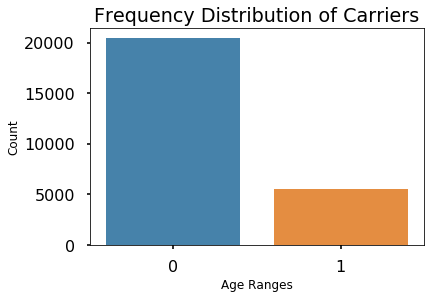

In [282]:
h1n1 = df_a['h1n1_vaccine'].value_counts()
#sns.set(style="darkgrid")
sns.barplot(h1n1.index, h1n1.values, alpha=0.9)
plt.title('Frequency Distribution of Carriers')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Age Ranges', fontsize=12)
plt.show()

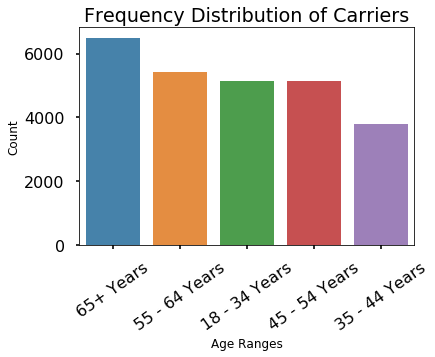

In [283]:
age_grp = df_a['age_group'].value_counts()
#sns.set(style="darkgrid")
sns.barplot(age_grp.index, age_grp.values, alpha=0.9)
plt.xticks(rotation=35)
plt.title('Frequency Distribution of Carriers')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Age Ranges', fontsize=12)
plt.show()

In [284]:
#sns.pairplot(df, hue='target', pallette='Dark2')
#separated 1 is going to be succesful class
#obj = ['age_group', 'education', 'race', 'sex', 'income_poverty',
#       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region']
#sns.pairplot(df_a, hue='h1n1_vaccine', palette='Dark2')

In [285]:
obj_cols = df_a.select_dtypes('object')
obj_cols.head()

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,employment_industry,employment_occupation
0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,Not in Labor Force,Not in Labor Force
1,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",pxcmvdjn,xgwztkwe
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",rucpziij,xtkaffoo
3,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",Not in Labor Force,Not in Labor Force
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",wxleyezf,emcorrxb


In [286]:
obj_cols.columns

Index(['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'employment_industry', 'employment_occupation'],
      dtype='object')

In [287]:
obj_feats = ['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'employment_industry', 'employment_occupation']
obj_dummies = pd.get_dummies(df_a[obj_feats],drop_first=True)#

In [288]:
obj_dummies.head()

,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [289]:
result_df = pd.concat([df_a,obj_dummies], axis=1)

In [290]:
result_df.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,Not in Labor Force,Not in Labor Force,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,5.0,5.0,4.0,1.

In [291]:
result_df.isna().sum()

h1n1_concern                            0
h1n1_knowledge                          0
behavioral_antiviral_meds               0
behavioral_avoidance                    0
behavioral_face_mask                    0
behavioral_wash_hands                   0
behavioral_large_gatherings             0
behavioral_outside_home                 0
behavioral_touch_face                   0
doctor_recc_h1n1                        0
doctor_recc_seasonal                    0
chronic_med_condition                   0
child_under_6_months                    0
health_worker                           0
health_insurance                        0
opinion_h1n1_vacc_effective             0
opinion_h1n1_risk                       0
opinion_h1n1_sick_from_vacc             0
opinion_seas_vacc_effective             0
opinion_seas_risk                       0
opinion_seas_sick_from_vacc             0
age_group                               0
education                               0
race                              

In [292]:
cols = ['age_group', 'education', 'race', 'sex', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'hhs_geo_region',
       'census_msa', 'employment_industry', 'employment_occupation']
df_dummies = result_df.drop(cols, axis=1) 

In [293]:
df_dummies.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,0.0,0.0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,4.0,1.0,2.0,2.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,5.0,5.0,4.0,1.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,4.0,1.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [294]:
df_dummies.shape

(25985, 101)

In [295]:
#Normalize-normalize all features to a consistent scale of 0 to 1.
X = df_dummies.drop('h1n1_vaccine',axis=1).copy() #df_dummies_1.drop('h1n1_vaccine',axis=1).copy()
y = df_dummies['h1n1_vaccine']

In [296]:
# #Standardization-standard range of units
# for col in X.columns:
#     # Subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
#     X[col] = (X[col] - min(X[col]))/ (max(X[col]) - min(X[col])) 

# X.head()

In [297]:
from sklearn.model_selection import train_test_split

In [298]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [299]:
pd.Series(y_train).value_counts(normalize=True)

0    0.787926
1    0.212074
Name: h1n1_vaccine, dtype: float64

### Logistic Regression

In [300]:
# # Here we iterate through the confusion matrix and append labels to our visualization 
# def plot_cm(cnf_matrix,thresh=0.5):
#     import itertools
#     plt.imshow(cnf_matrix,  cmap=plt.cm.Blues) 

#     plt.ylabel('True Class')
#     plt.xlabel('Predicted Class')
#     plt.xticks(ticks=[0,1],labels=['No Shot','Shot'])
#     plt.yticks(ticks=[0,1],labels=['No Shot','Shot'])

#     for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
#             plt.text(j, i, cnf_matrix[i, j],
#                      horizontalalignment='center',
#                      color='white' if cnf_matrix[i, j] > thresh else 'black')
#     plt.colorbar()
    
# #     acc = accuracy_score(y_test,/.predict(X_test))
# #     plt.title(f"Confusion Matrix (overall acc={round(acc,2)})")
#     plt.show()

In [301]:
from sklearn.linear_model import LogisticRegression
#accuracy-how to judge model's performance

regr = LogisticRegression(fit_intercept=False,C=1e5, solver='liblinear')
regr.fit(X_train, y_train)

y_hat_test = regr.predict(X_test)


In [302]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report

In [303]:
# #TN FP
# #FN TP
cm = confusion_matrix(y_test, y_hat_test)
cm

array([[6389,  343],
       [ 845,  999]])

In [304]:
def evaluate_classification(y_true, y_pred,X_true, clf): 
    import sklearn.metrics as metrics
    print(confusion_matrix(y_test, y_hat_test))
    
    ## Classification Report / Scores 
    print(metrics.classification_report(y_true,y_pred))
 
    fig, ax = plt.subplots(figsize=(10,5),ncols=2)
    metrics.plot_confusion_matrix(clf,X_true,y_true,cmap="Greens",
                                  normalize='true',ax=ax[0])
    ax[0].set(title='Confusion Matrix')
    y_score = clf.predict_proba(X_true)[:,1]

    fpr,tpr,thresh = metrics.roc_curve(y_true,y_score)
    # print(f"ROC-area-under-the-curve= {}")
    roc_auc = round(metrics.auc(fpr,tpr),3)
    ax[1].plot(fpr,tpr,color='darkorange',label=f'ROC Curve (AUC={roc_auc})')
    ax[1].plot([0,1],[0,1],ls=':')
    ax[1].legend()
    ax[1].grid()
    ax[1].set(ylabel='True Positive Rate',xlabel='False Positive Rate',
          title='Receiver operating characteristic (ROC) Curve')
    plt.tight_layout()  

[[6389  343]
 [ 845  999]]
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      6732
           1       0.74      0.54      0.63      1844

    accuracy                           0.86      8576
   macro avg       0.81      0.75      0.77      8576
weighted avg       0.85      0.86      0.85      8576



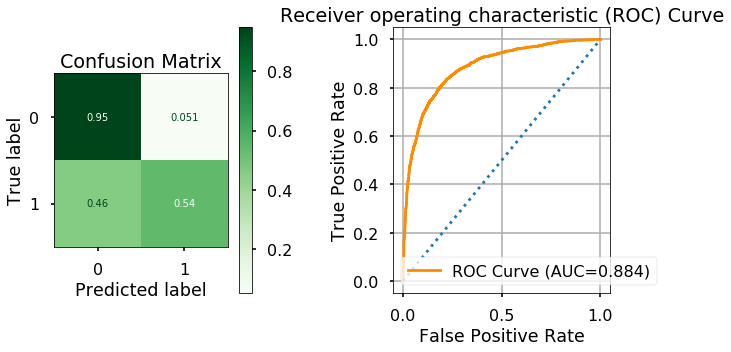

In [305]:
# y_hat_test = logreg.predict(X_test)
# y_hat_train = logreg.predict(X_train)
evaluate_classification(y_test,y_hat_test,X_test,regr)    

In [306]:
# y_hat_test = regr.predict(X_test_sca)

# cm = confusion_matrix(y_test,y_hat_test)
# cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
# print(classification_report(y_test,y_hat_test))
# # plot_cm(cm_norm.round(3))
# plot_confusion_matrix(regr,X_test_sca,y_test,
#                      cmap='Blues',normalize='true')

In [307]:
# cm = confusion_matrix(y_test, y_hat_test)
# cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
# print(accuracy_score(y_test, y_hat_test))
# plot_cm(cm_norm.round(3))

In [308]:
# import numpy as np
# # We could subtract the two columns. If values or equal, difference will be zero. Then count number of zeros 
# residuals = np.abs(y_train - y_hat_train)
# print(pd.Series(residuals).value_counts())
# print(pd.Series(residuals).value_counts(normalize=True))

In [309]:
# residuals = np.abs(y_test - y_hat_test)
# print(pd.Series(residuals).value_counts())
# print(pd.Series(residuals).value_counts(normalize=True))

#### Logisitc Regression / Scaled Data

In [310]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = MinMaxScaler()
X_train_sca = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test_sca = pd.DataFrame(scaler.transform(X_test),columns=X_test.columns, index=X_test.index)

In [311]:
#scaled data between 0 and 1
X_train_sca.describe().round(2).loc[['min','max']]

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [312]:
#max isn't always 1 w/test
X_test_sca.describe().round(2).loc[['min','max']]

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,seasonal_vaccine,age_group_35 - 44 Years,age_group_45 - 54 Years,age_group_55 - 64 Years,age_group_65+ Years,education_< 12 Years,education_College Graduate,education_Grad School +,education_Some College,race_Hispanic,race_Other or Multiple,race_White,sex_Male,"income_poverty_> $75,000",income_poverty_Below Poverty,income_poverty_Not in Labor Force,marital_status_Neither,marital_status_Not Married,rent_or_own_Own,rent_or_own_Rent,employment_status_Not in Labor Force,employment_status_Unemployed,hhs_geo_region_bhuqouqj,hhs_geo_region_dqpwygqj,hhs_geo_region_fpwskwrf,hhs_geo_region_kbazzjca,hhs_geo_region_lrircsnp,hhs_geo_region_lzgpxyit,hhs_geo_region_mlyzmhmf,hhs_geo_region_oxchjgsf,hhs_geo_region_qufhixun,"census_msa_MSA, Principle City",census_msa_Non-MSA,employment_industry_arjwrbjb,employment_industry_atmlpfrs,employment_industry_cfqqtusy,employment_industry_dotnnunm,employment_industry_fcxhlnwr,employment_industry_haxffmxo,employment_industry_ldnlellj,employment_industry_mcubkhph,employment_industry_mfikgejo,employment_industry_msuufmds,employment_industry_nduyfdeo,employment_industry_phxvnwax,employment_industry_pxcmvdjn,employment_industry_qnlwzans,employment_industry_rucpziij,employment_industry_saaquncn,employment_industry_vjjrobsf,employment_industry_wlfvacwt,employment_industry_wxleyezf,employment_industry_xicduogh,employment_industry_xqicxuve,employment_occupation_bxpfxfdn,employment_occupation_ccgxvspp,employment_occupation_cmhcxjea,employment_occupation_dcjcmpih,employment_occupation_dlvbwzss,employment_occupation_emcorrxb,employment_occupation_haliazsg,employment_occupation_hfxkjkmi,employment_occupation_hodpvpew,employment_occupation_kldqjyjy,employment_occupation_mxkfnird,employment_occupation_oijqvulv,employment_occupation_pvmttkik,employment_occupation_qxajmpny,employment_occupation_rcertsgn,employment_occupation_tfqavkke,employment_occupation_ukymxvdu,employment_occupation_uqqtjvyb,employment_occupation_vlluhbov,employment_occupation_xgwztkwe,employment_occupation_xqwwgdyp,employment_occupation_xtkaffoo,employment_occupation_xzmlyyjv
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [313]:
#precision-how precise the predcitions are.
#    How many of oyur psotives were actuallytrue. How many of class 1 were actually class 1.
#    how accurate model ws at accuratly predicting true psotive values.
#    true positives / predicted positves
#recall-indicates what percentage of the classes were actaully captured by the model.


#Recall-out of the number of true postives,how many of them did it find
#how good is my model in finding class that I acutlly care about.
# # of true positves / # of actual total postives

#classification report
#support-how many observations there were for each group
#weighted - # precision * # of observations
#recall-when true postives/opporunties is small and don't want to miss one.
#   telling someine they don't have cancer when they do is fatal.
#precision-cost of acting is high and acting on a postive is costly
#   allocating resoucrs for prisoners who are at risk for recidivism.

#for people who didn't get shot, whose true class was 0, it correctly predictd 95%.
#.05 were misclassified
#95% is class accurqcy for people who didn't get shot- class accurcies
#.57 is accuracy for people who got shot - class accuracies
#average of diagnoals, give you accuracy score

In [324]:
# by having large C, it's having small parameter added to equation
#C-1/lmbda. Large C 
#sma;; small data sets liblinear.  'sag' and 'saga' for larger ones.
regr = LogisticRegression(fit_intercept= True, C=1.0, max_iter=1000)# solver='liblinear',C=1e12
regr.fit(X_train_sca, y_train)

y_hat_test = regr.predict(X_test_sca)


[[6402  330]
 [ 814 1030]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      6732
           1       0.76      0.56      0.64      1844

    accuracy                           0.87      8576
   macro avg       0.82      0.75      0.78      8576
weighted avg       0.86      0.87      0.86      8576



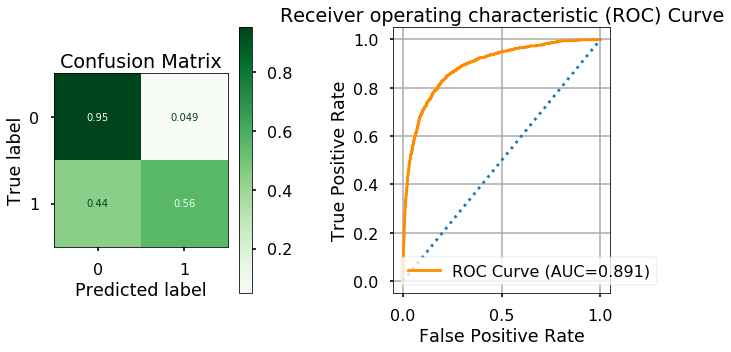

In [325]:
evaluate_classification(y_test,y_hat_test,X_test_sca,regr)    

In [114]:
# #how well were these classes predicted
# #Normalize them / divding by sum for each class
# #look at first vector. How valid points fr that total class (6269 + 361)
# # 756 + 1013 = 
# cm[0].sum()

In [115]:
#cm.sum(axis=1)

In [116]:
# #of that class how many were actual survivors
# cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
# cm_norm

In [117]:
#normalize according to true classes

# plot_confusion_matrix(regr, X_test, y_test, cmap='Blues', normalize='true');

In [118]:
# # Here we iterate through the confusion matrix and append labels to our visualization 
# def plot_cm(cnf_matrix,thresh=0.5):
#     import itertools
#     plt.imshow(cnf_matrix,  cmap=plt.cm.Blues) 

#     plt.ylabel('True Class')
#     plt.xlabel('Predicted Class')
#     plt.xticks(ticks=[0,1],labels=['No Shot','Shot'])
#     plt.yticks(ticks=[0,1],labels=['No Shot','Shot'])

#     for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
#             plt.text(j, i, cnf_matrix[i, j],
#                      horizontalalignment='center',
#                      color='white' if cnf_matrix[i, j] > thresh else 'black')
#     plt.colorbar()
    
# #     acc = accuracy_score(y_test,/.predict(X_test))
# #     plt.title(f"Confusion Matrix (overall acc={round(acc,2)})")
#     plt.show()

In [119]:
# plot_cm(cm_norm.round(3))

In [120]:
# #no regualrization
# #default: C=1.0, incude penalty='12'
# regr = LogisticRegression()#(fit_intercept=False, C=1e12, solver='liblinear')
# regr.fit(X_train_sca, y_train)
# y_hat_test = regr.predict(X_test) #going back to scaled data

# cm = confusion_matrix(y_test, y_hat_test)
# cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
# print(accuracy_score(y_test, y_hat_test))
# plot_cm(cm_norm.round(3))

### Precision and Recall

In [121]:
#precision-how precise the predcitions are.
#    How many of oyur psotives were actuallytrue. How many of class 1 were actually class 1.
#    how accurate model ws at accuratly predicting true psotive values.
#    true positives / predicted positves
#recall-indicates what percentage of the classes were actaully captured by the model.
# from sklearn import metrics
# metrics.precision_score(y_test, y_hat_test).round(2)

In [122]:
# #Recall-out of the number of true postives,how many of them did it find
# #how good is my model in finding class that I acutlly care about.
# # # of true positves / # of actual total postives
# metrics.recall_score(y_test,y_hat_test)

### F1 Score

In [123]:
# #harminic mean of precision and recall
# #best for overall quality of data b/c F1_score can't be high unless both precision snd recall are also high.  Most informative about overall model quality.
# #When F1 score is high you knw model is doing well all around. But difficult to express to non-tech audience.
# #Don't use in presentation
# metrics.f1_score(y_test, y_hat_test)

### Classification Report

In [124]:
# #support-how many observations there were for each group
# #weighted - # precision * # of observations
# #recall-when true postives/opporunties is small and don't want to miss one.
# #   telling someine they don't have cancer when they do is fatal.
# #precision-cost of acting is high and acting on a postive is costly
# #   allocating resoucrs for prisoners who are at risk for recidivism.
# from sklearn.metrics import classification_report
# print(classification_report(y_test,y_hat_test))

### ROC Curve

In [125]:
#number of TP vs. # of false positives.
#if we have low number of false positives and high # of true postives, we'll have alue that will hug top right corner.
#  how far to the top left are cruve is, to judge how ggod our model is.
#want curve as close to top left. Not towards the middle.
from sklearn.metrics import roc_curve, auc

# Scikit-learn's built in roc_curve method returns the fpr, tpr, and thresholds
# for various decision boundaries given the case member probabilites
y_score = regr.decision_function(X_test)
y_score_prob = regr.predict_proba(X_test)

y_score.shape, y_score_prob.shape

((8576,), (8576, 2))

In [126]:
#probability of falling in class 0 and probabilty of falling class 1
y_score_prob

array([[4.07319321e-06, 9.99995927e-01],
       [3.84548705e-02, 9.61545129e-01],
       [2.62086329e-03, 9.97379137e-01],
       ...,
       [1.24186376e-01, 8.75813624e-01],
       [1.91812751e-06, 9.99998082e-01],
       [1.27842601e-02, 9.87215740e-01]])

In [127]:
# y_score = regr.decision_function(X_test)
fpr,tpr,thresh = roc_curve(y_test,y_score)
print(f"ROC-area-under-the-curve= {round(auc(fpr,tpr),3)}")

ROC-area-under-the-curve= 0.855


[Text(0, 0.5, 'True Positive Rate'),
 Text(0.5, 0, 'False Positive Rate'),
 Text(0.5, 1.0, 'Receiver operating characteristic (ROC) Curve')]

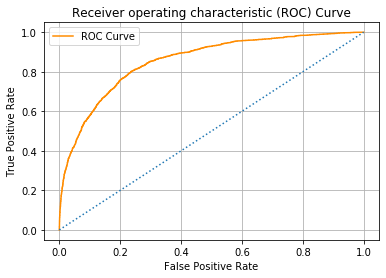

In [128]:
# is it close to diagnal line?
#diagonal line indicates it's worthless
fig,ax=plt.subplots()
ax.plot(fpr,tpr,color='darkorange',label='ROC Curve')
ax.plot([0,1],[0,1],ls=':')
ax.legend()
ax.grid()
ax.set(ylabel='True Positive Rate',xlabel='False Positive Rate',
      title='Receiver operating characteristic (ROC) Curve')


In [129]:
# y_score = regr.decision_function(X_test)
fpr,tpr,thresh = roc_curve(y_test,y_score_prob[:,1])
print(f"ROC-area-under-the-curve= {round(auc(fpr,tpr),3)}")

ROC-area-under-the-curve= 0.855


[Text(0, 0.5, 'True Positive Rate'),
 Text(0.5, 0, 'False Positive Rate'),
 Text(0.5, 1.0, 'Receiver operating characteristic (ROC) Curve')]

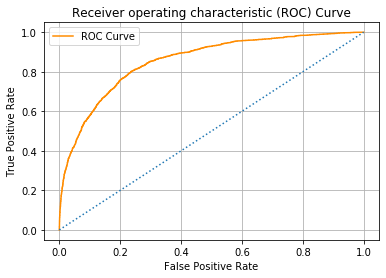

In [130]:
# is it close to diagnal line?
#diagonal line indicates it's worthless
fig,ax=plt.subplots()
ax.plot(fpr,tpr,color='darkorange',label='ROC Curve')
ax.plot([0,1],[0,1],ls=':')
ax.legend()
ax.grid()
ax.set(ylabel='True Positive Rate',xlabel='False Positive Rate',
      title='Receiver operating characteristic (ROC) Curve')


### Class Imbalance

In [131]:
#baseline model
# from sklearn
regr = LogisticRegression()#C=1e5, solver='liblinear')
regr.fit(X_train_sca, y_train)

y_hat_test = regr.predict(X_test_sca)

# cm = confusion_matrix(y_test,y_hat_test)
# cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
# print(classification_report(y_test,y_hat_test))
# # plot_cm(cm_norm.round(3))
# plot_confusion_matrix(regr,X_test_sca,y_test,
#                      cmap='Blues',normalize='true')

/Users/davidtorres/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [132]:
#21% of observations were class 1
y_train.value_counts(normalize=True)

0    0.787926
1    0.212074
Name: h1n1_vaccine, dtype: float64

In [133]:
y_test.value_counts(normalize=True)

0    0.784981
1    0.215019
Name: h1n1_vaccine, dtype: float64

In [134]:
#no modeling involved, just guessed value 0.
## Let's guess  for every observation
preds = np.zeros_like(y_test)
print(classification_report(y_test,preds))
#cm_norm = get_conf_matrix(y_test,preds)
#plot_cm(cm_norm)

              precision    recall  f1-score   support

           0       0.78      1.00      0.88      6732
           1       0.00      0.00      0.00      1844

    accuracy                           0.78      8576
   macro avg       0.39      0.50      0.44      8576
weighted avg       0.62      0.78      0.69      8576



/Users/davidtorres/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [135]:
#solution
#solution: class weight parameter for scikit leanr models
pd.Series(y_test).value_counts()

0    6732
1    1844
Name: h1n1_vaccine, dtype: int64

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      6732
           1       0.75      0.56      0.64      1844

    accuracy                           0.87      8576
   macro avg       0.82      0.75      0.78      8576
weighted avg       0.86      0.87      0.86      8576



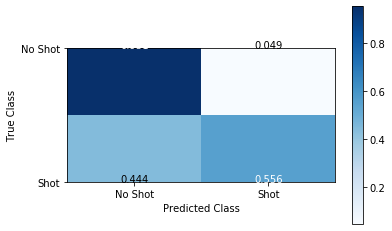

In [136]:
#baseline
#
regr = LogisticRegression(C=1e5, solver='liblinear')
regr.fit(X_train_sca, y_train)

y_hat_test = regr.predict(X_test_sca)

cm = confusion_matrix(y_test,y_hat_test)
cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
print(classification_report(y_test,y_hat_test))
plot_cm(cm_norm.round(3))

####

              precision    recall  f1-score   support

           0       0.94      0.82      0.87      6732
           1       0.55      0.81      0.65      1844

    accuracy                           0.81      8576
   macro avg       0.74      0.81      0.76      8576
weighted avg       0.86      0.81      0.83      8576



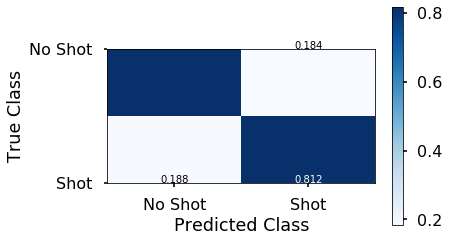

In [344]:
#try to autmatically adjust its predictions 
#if you cared more about predicting who got shot then this is better.
#if we cared more about postive classes, this better eventhoug hoverall accuracy hasn't changed.
regr = LogisticRegression(fit_intercept= True, C=1.0, max_iter=1000,class_weight='balanced')
regr.fit(X_train_sca, y_train)

y_hat_test = regr.predict(X_test_sca)

cm = confusion_matrix(y_test,y_hat_test)
cm_norm = cm / cm.sum(axis=1)[:,np.newaxis]
print(classification_report(y_test,y_hat_test))
plot_cm(cm_norm.round(3))


[[5490 1242]
 [ 347 1497]]
              precision    recall  f1-score   support

           0       0.94      0.82      0.87      6732
           1       0.55      0.81      0.65      1844

    accuracy                           0.81      8576
   macro avg       0.74      0.81      0.76      8576
weighted avg       0.86      0.81      0.83      8576



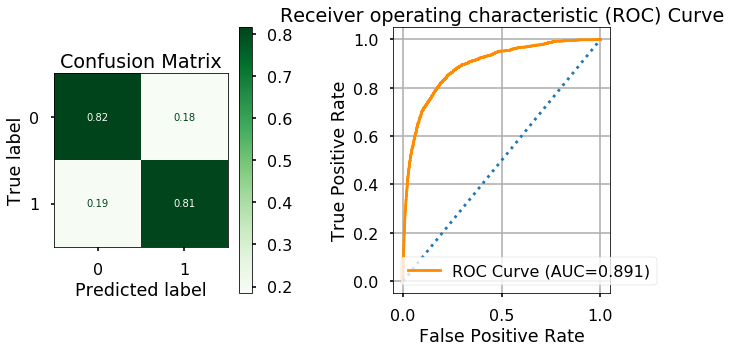

In [327]:
evaluate_classification(y_test,y_hat_test,X_test_sca,regr)  

In [349]:
col_coef= pd.Series(regr.coef_[0], index=X_train.columns)
col_coef

h1n1_concern                            0.131180
h1n1_knowledge                          0.171411
behavioral_antiviral_meds               0.148321
behavioral_avoidance                   -0.006639
behavioral_face_mask                    0.264247
behavioral_wash_hands                  -0.011830
behavioral_large_gatherings            -0.156381
behavioral_outside_home                 0.095486
behavioral_touch_face                  -0.040367
doctor_recc_h1n1                        2.244236
doctor_recc_seasonal                   -1.073092
chronic_med_condition                   0.079887
child_under_6_months                    0.424702
health_worker                           0.560199
health_insurance                        1.416293
opinion_h1n1_vacc_effective             2.261389
opinion_h1n1_risk                       1.594569
opinion_h1n1_sick_from_vacc             0.023801
opinion_seas_vacc_effective            -0.336384
opinion_seas_risk                      -0.094527
opinion_seas_sick_fr

### Solution 2: SMOTE

In [138]:
#oversampling minority class
y_train.value_counts()

0    13717
1     3692
Name: h1n1_vaccine, dtype: int64

In [328]:
#before-adjusting weight that our model uses, to make up for class imbalance.
#resampling our minority class to make it have as many observations as our majoirty class.
#going to tak class you ahve less of and generate new observations for and did it. New data won't skew data 
#only smote training data
#modle will learin in a more blanced way
#just wantto make sureit learns.
from imblearn.over_sampling import SMOTE
smote = SMOTE()

X_train_smote, y_train_smote = smote.fit_sample(X_train_sca,y_train)
pd.Series(y_train_smote).value_counts()

/Users/davidtorres/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


1    13717
0    13717
dtype: int64

In [329]:
regr = LogisticRegression(fit_intercept= True, C=1.0, max_iter=1000)
regr.fit(X_train_smote, y_train_smote)

y_hat_test = regr.predict(X_test_sca)


[[5571 1161]
 [ 373 1471]]
              precision    recall  f1-score   support

           0       0.94      0.83      0.88      6732
           1       0.56      0.80      0.66      1844

    accuracy                           0.82      8576
   macro avg       0.75      0.81      0.77      8576
weighted avg       0.86      0.82      0.83      8576



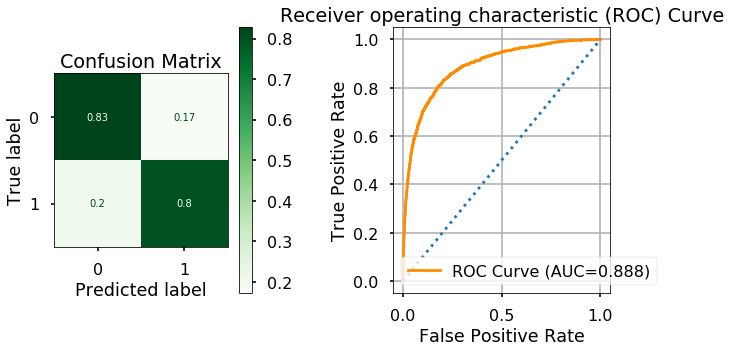

In [330]:
evaluate_classification(y_test,y_hat_test,X_test_sca,regr) 

### GridSearchCV

In [331]:
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter space
C = np.logspace(0, 4, 10)

# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty)


In [332]:
from sklearn.model_selection import GridSearchCV
#clf = KNeighborsClassifier()
#param_grid = dict( n_neighbors = list(range(1,26,2)))#,
#                  p = [1,2])
regr = LogisticRegression(class_weight='balanced',C=1e5, solver='liblinear')
regr.fit(X_train_sca, y_train)

test_preds = regr.predict(X_test_sca)
grid = GridSearchCV(regr,hyperparameters, scoring='f1',verbose=1,return_train_score=True)
#grid is model
grid.fit(X_train_sca,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


KeyboardInterrupt: 

In [144]:
grid.best_params_

{'C': 1.0, 'penalty': 'l1'}

In [145]:
regr = grid.best_estimator_

[[5486 1246]
 [ 348 1496]]
              precision    recall  f1-score   support

           0       0.94      0.81      0.87      6732
           1       0.55      0.81      0.65      1844

    accuracy                           0.81      8576
   macro avg       0.74      0.81      0.76      8576
weighted avg       0.86      0.81      0.83      8576



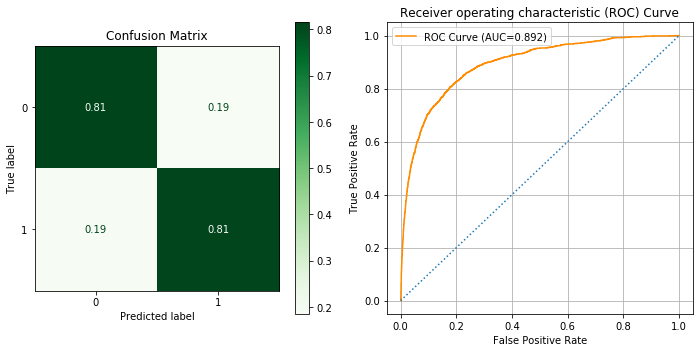

In [146]:
y_hat_test = regr.predict(X_test_sca)
evaluate_classification(y_test, y_hat_test,X_test_sca, regr)

In [333]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.tree import export_graphviz
from IPython.display import Image  
from sklearn.tree import export_graphviz
from pydotplus import graph_from_dot_data

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      6732
           1       0.54      0.53      0.54      1844

    accuracy                           0.80      8576
   macro avg       0.71      0.71      0.71      8576
weighted avg       0.80      0.80      0.80      8576



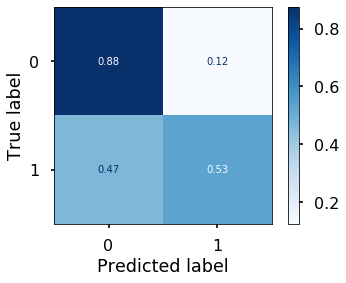

In [337]:
from sklearn import metrics
clf = DecisionTreeClassifier(class_weight='balanced',criterion='gini')
clf.fit(X_train_sca,y_train)
y_hat_test = clf.predict(X_test_sca)

print(metrics.classification_report(y_test,y_hat_test))
metrics.plot_confusion_matrix(clf,X_test_sca,y_test,cmap='Blues',
                              normalize='true')

In [149]:
# dot_data = export_graphviz(regr, out_file=None, 
#                            feature_names=X_train_sca.columns,  
#                            class_names=np.unique(y).astype('str'), 
#                            filled=True, rounded=True, special_characters=True)

# # Draw graph
# graph = graph_from_dot_data(dot_data)  

# # Show graph
# Image(graph.create_png())

In [150]:
# df.isna().sum()
# df[['super_dist','release_type']] = df[['super_dist','release_type']].fillna('Missing')
# df.isna().sum()

### Decision Trees

In [151]:
# #Decision trees don't regquire data to be scaled, but we can scale
# df_3 = df_dummies

In [152]:
# df_3.head()

In [153]:
# df_3.shape

In [154]:
# # X = df_dummies_1.drop('h1n1_vaccine',axis=1).copy() #df_dummies_1.drop('h1n1_vaccine',axis=1).copy()
# # y = df_dummies_1['h1n1_vaccine']
# X = df_3.drop('h1n1_vaccine',axis=1).copy() #df_dummies_1.drop('h1n1_vaccine',axis=1).copy()
# y = df_3['h1n1_vaccine']

In [155]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [156]:
#unbalanced
y_train.value_counts(normalize=True)

0    0.787674
1    0.212326
Name: h1n1_vaccine, dtype: float64

In [157]:
#only want t orebalance training data so model can learn 
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_train_res, y_train_res = smote.fit_sample(X_train, y_train)

/Users/davidtorres/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [158]:
#chekc to make sure balanced
pd.Series(y_train_res).value_counts()

1    14327
0    14327
dtype: int64

In [342]:
#baseline
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier(class_weight='balanced',max_depth=5)

tree.fit(X_train, y_train)
y_hat_test = tree.predict(X_test)

              precision    recall  f1-score   support

           0       0.94      0.81      0.87      6732
           1       0.54      0.80      0.64      1844

    accuracy                           0.81      8576
   macro avg       0.74      0.81      0.76      8576
weighted avg       0.85      0.81      0.82      8576



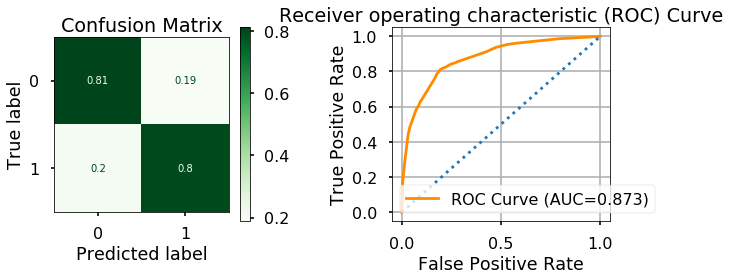

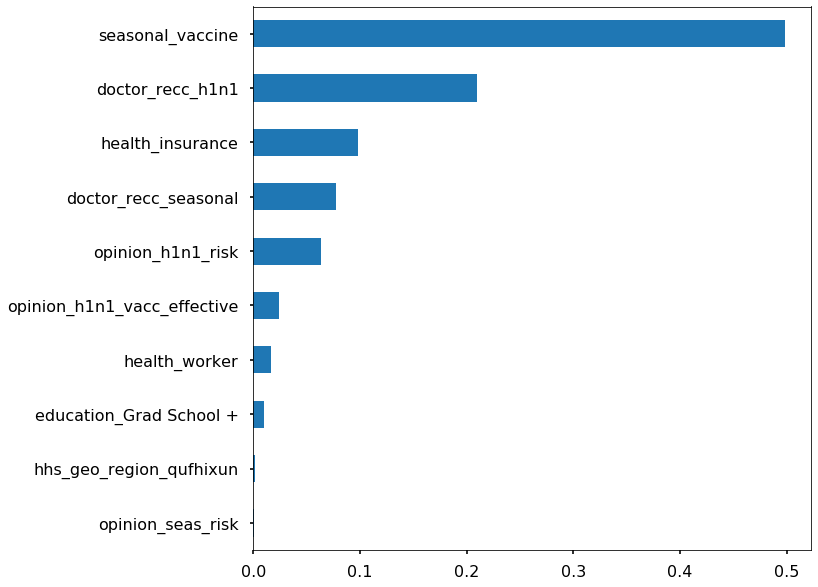

In [343]:
evaluate_model(y_test,y_hat_test,X_test,tree)

In [160]:
plt.style.use('seaborn-poster')

In [161]:
#what are the most imprtant features
df_import = pd.Series(tree.feature_importances_, index = X_train.columns,name='Importance')
df_import.sort_values()

h1n1_concern                            0.000000
employment_industry_vjjrobsf            0.000000
employment_industry_saaquncn            0.000000
employment_industry_rucpziij            0.000000
employment_industry_qnlwzans            0.000000
employment_industry_pxcmvdjn            0.000000
employment_industry_phxvnwax            0.000000
employment_industry_nduyfdeo            0.000000
employment_industry_msuufmds            0.000000
employment_industry_mfikgejo            0.000000
employment_industry_mcubkhph            0.000000
employment_industry_ldnlellj            0.000000
employment_industry_haxffmxo            0.000000
employment_industry_fcxhlnwr            0.000000
employment_industry_dotnnunm            0.000000
employment_industry_cfqqtusy            0.000000
employment_industry_atmlpfrs            0.000000
employment_industry_arjwrbjb            0.000000
census_msa_Non-MSA                      0.000000
census_msa_MSA, Principle City          0.000000
hhs_geo_region_qufhi

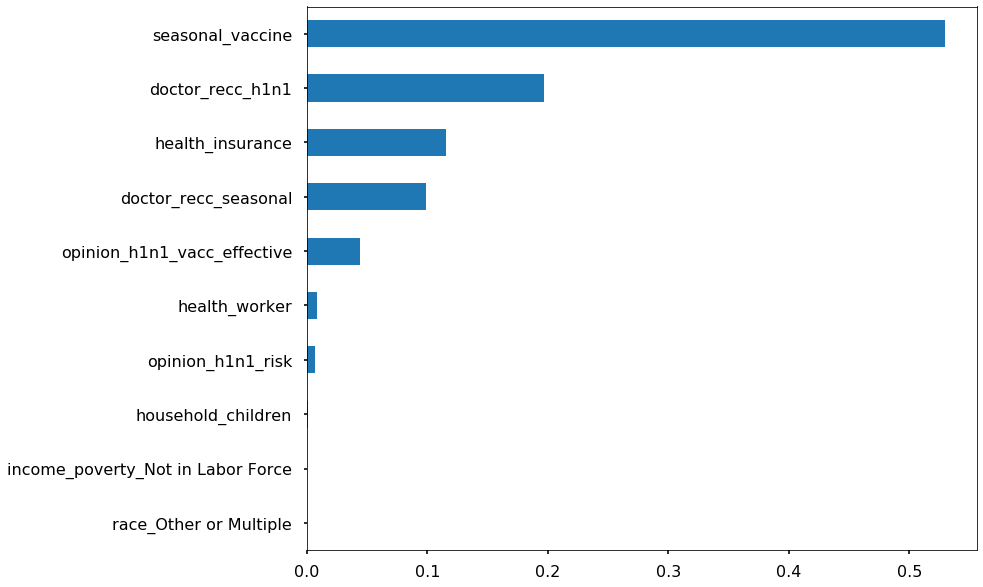

In [162]:
#df_import = pd.DataFrame(tree.feature_importances_, X_train.columns)
#df_import.plot(kind='barh', figsize=('12,110'))
df_import.sort_values(ascending=True).tail(10).plot(kind='barh',figsize=(12,10))

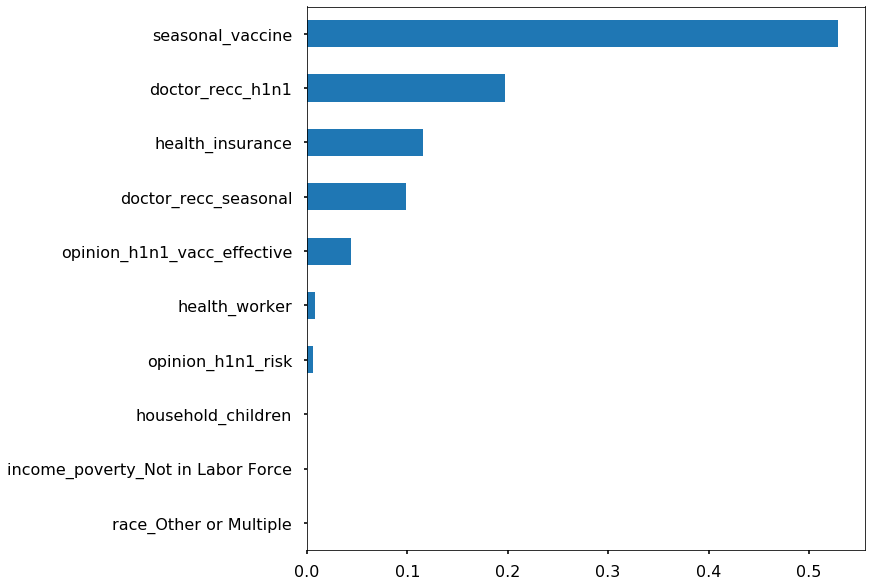

In [163]:
def plot_importance(tree, top_n=10,figsize=(10,10)):
    df_importance = pd.Series(tree.feature_importances_,index=X_train.columns)
    df_importance.sort_values(ascending=True).tail(top_n).plot(
        kind='barh',figsize=figsize)
    return df_importance
plot_importance(tree);

In [164]:
y_hat_test = tree.predict(X_test)

              precision    recall  f1-score   support

           0       0.91      0.86      0.89      6122
           1       0.58      0.69      0.63      1674

    accuracy                           0.83      7796
   macro avg       0.75      0.78      0.76      7796
weighted avg       0.84      0.83      0.83      7796



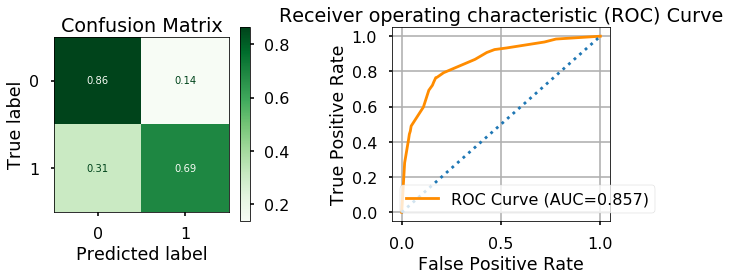

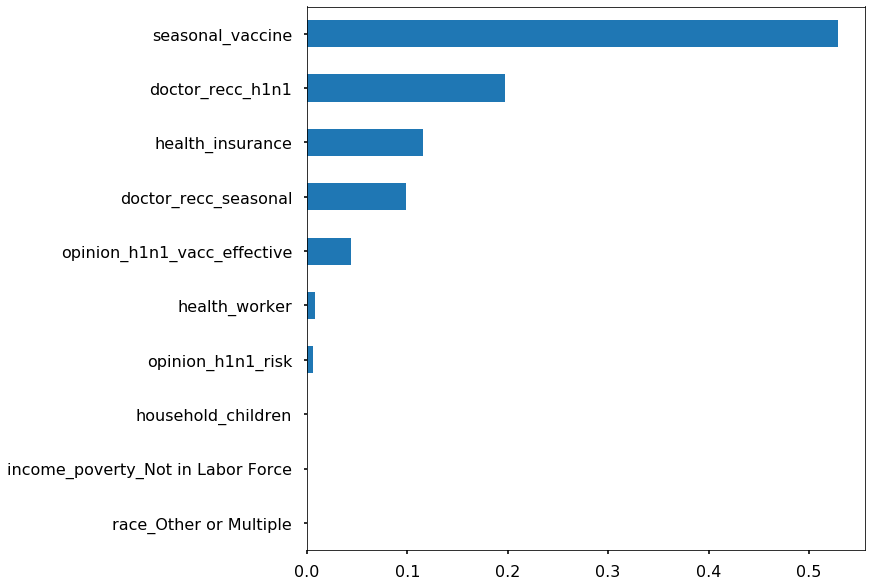

In [165]:
## Write a fucntion to evalute the model
# a little bit better than flipping a coin to see who got teh H1N1 shot.
import sklearn.metrics as metrics

def evaluate_model(y_true, y_pred,X_true,clf):
    
    ## Classification Report / Scores 
    print(metrics.classification_report(y_true,y_pred))

    fig, ax = plt.subplots(figsize=(10,4),ncols=2)
    metrics.plot_confusion_matrix(clf,X_true,y_true,cmap="Greens",
                                  normalize='true',ax=ax[0])
    ax[0].set(title='Confusion Matrix')
    y_score = clf.predict_proba(X_true)[:,1]

    fpr,tpr,thresh = metrics.roc_curve(y_true,y_score)
    # print(f"ROC-area-under-the-curve= {}")
    roc_auc = round(metrics.auc(fpr,tpr),3)
    ax[1].plot(fpr,tpr,color='darkorange',label=f'ROC Curve (AUC={roc_auc})')
    ax[1].plot([0,1],[0,1],ls=':')
    ax[1].legend()
    ax[1].grid()
    ax[1].set(ylabel='True Positive Rate',xlabel='False Positive Rate',
          title='Receiver operating characteristic (ROC) Curve')
    plt.tight_layout()
    plt.show()
    try: 
        df_important = plot_importance(clf)
    except:
        df_important = None
    
#     return df_important
evaluate_model(y_test,y_hat_test,X_test,tree)

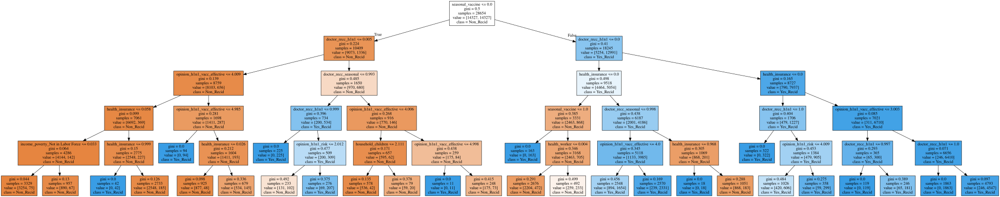

In [166]:
#if you have one-hot enocded column, less than .05 is 0 and greater 1
export_graphviz_kws={}#{'out_file':'tree.png'}

from sklearn.tree import export_graphviz
from IPython.display import SVG
import graphviz #import Source
from IPython.display import display
class_names=['Non_Recid','Yes_Recid']
# if feature_names is None:
feature_names=X_train.columns


tree_viz_kws =  dict(out_file=None, rotate=False, filled = True)
tree_viz_kws.update(export_graphviz_kws)



tree_data = export_graphviz(tree,feature_names=feature_names, 
                               class_names=class_names,**tree_viz_kws)
# tree.export_graphviz(dt) #if you wish to save the output to a dot file instead
graph = graphviz.Source(tree_data,format='png')
graph.render("tree.png")
display(graph)
# display(SVG(graph.pipe(format='svg')))

In [167]:
## visualize the decision tree
def visualize_tree(tree,feature_names=None,class_names=['0','1'],format_='png',
                   kws={},save_filename=None):
    """Visualizes a sklearn tree using sklearn.tree.export_graphviz"""
    from sklearn.tree import export_graphviz
    from IPython.display import SVG
    import graphviz #import Source
    from IPython.display import display
    
    if feature_names is None:
        feature_names=X_train.columns

    tree_viz_kws =  dict(out_file=None,rounded=True, rotate=False, filled = True)
    tree_viz_kws.update(kws)

    # tree.export_graphviz(dt) #if you wish to save the output to a dot file instead
    tree_data=export_graphviz(tree,feature_names=feature_names, 
                                   class_names=class_names,**tree_viz_kws)
    graph = graphviz.Source(tree_data,format=format_)#'png')
    display(graph)
    if save_filename is not None:
        graph.render(save_filename)

#     display(SVG(graph.pipe(format=format_)))#'svg')))

### GridSearch v DecisionTree

In [168]:
# max-depth
# min_samples_leaf: The smallest number of samples that can be in a leaf (node)
# min_samples_split: The smallest number of samples in a leaf (node) before splitting it
# max_features: Most features to consider when splitting

#GridSearch and Randomized Search
#XGboost is a model

In [169]:
tree_1 = DecisionTreeClassifier(max_depth=5)
tree_1.fit(X_train_res, y_train_res)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

0.830721864863379
0.8269625448948179
              precision    recall  f1-score   support

           0       0.91      0.86      0.89      6122
           1       0.58      0.69      0.63      1674

    accuracy                           0.83      7796
   macro avg       0.75      0.78      0.76      7796
weighted avg       0.84      0.83      0.83      7796



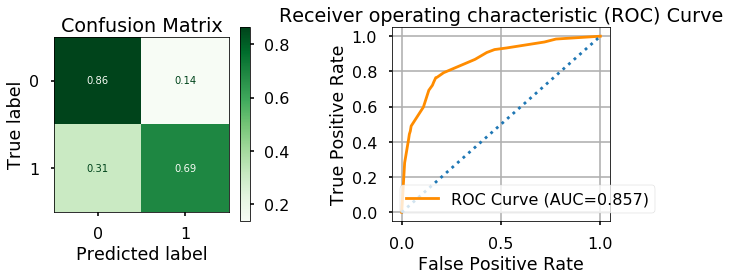

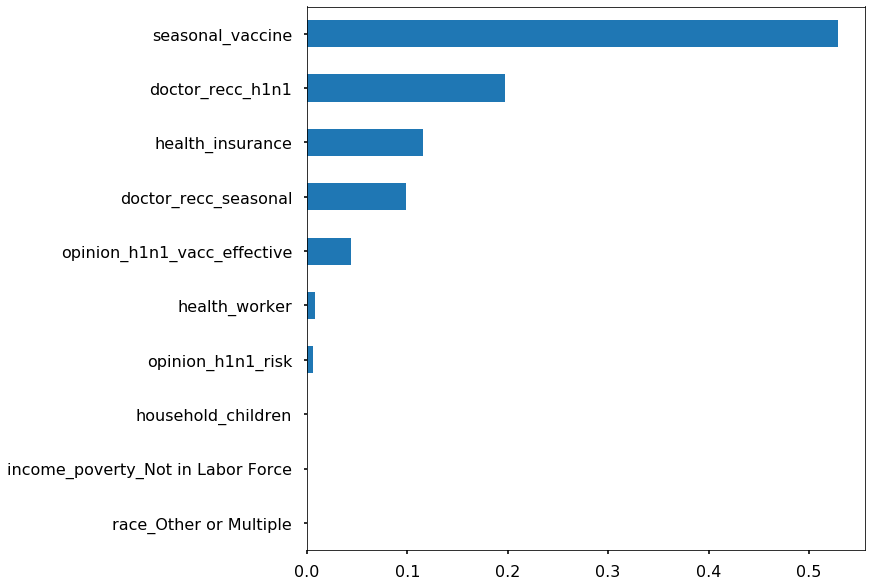

In [170]:
#get predcit and evaluate model
#how close does it have to be for overfit
#I think not so bad at misclassifying who got shot
y_hat_test_1 = tree_1.predict(X_test)
#evaluate model
train_score = tree_1.score(X_train, y_train)  # see how overfit our model is
test_score = tree_1.score(X_test, y_test) 
print(train_score)
print(test_score)
evaluate_model(y_test, y_hat_test_1, X_test, tree_1)

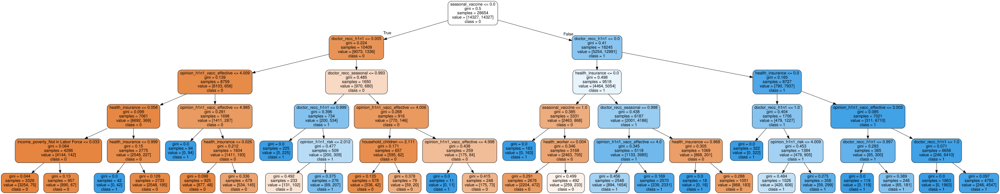

In [171]:
visualize_tree(tree_1, save_filename='vanilla tree')

In [172]:
import tzlocal
import datetime as dt
tz = tzlocal.get_localzone()
print(tz)
start = dt.datetime.now(tz)
print(start.strftime("%m/%d/%y - %I:%M %p"))
print(dt.datetime.now(tz))

America/New_York
04/28/20 - 01:36 PM
2020-04-28 13:36:01.776000-04:00


In [173]:
## a timer to record how long a process takes
class Timer():
    ## def init
    def __init__(self,format_="%m/%d/%y - %I:%M %p"):
        import tzlocal
        self.tz = tzlocal.get_localzone()
        self.fmt = format_
        
        self.created_at = self.get_time()# get time
        

    
    ## def get time method
    def get_time(self):
        import datetime as dt
        return dt.datetime.now(self.tz)

    ## def start
    def start(self):
        time = self.get_time()
        self.start = time
        print(f"[i] Timer started at{self.start.strftime(self.fmt)}")
        
        

    ## def stop
    def stop(self):
        time = self.get_time()
        self.end = time
        print(f"[i] Timer ended at {self.end.strftime(self.fmt)}")
        print(f"- Total time = {self.end-self.start}")
timer = Timer()
print(timer.created_at)
timer.start()

2020-04-28 13:36:01.800753-04:00
[i] Timer started at04/28/20 - 01:36 PM


In [174]:
timer.stop()

[i] Timer ended at 04/28/20 - 01:36 PM
- Total time = 0:00:00.025669


In [175]:
## Import GridSearch
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
## Instantiate classifier
tree_1 = DecisionTreeClassifier()
## Set up param grid
param_grid = {'criterion':['gini','entropy'],
             'max_depth':[None, 5, 3, 10],
             'max_features':['auto','sqrt',3,5,10,30,70]} #how many features to test out

## Instantiate GridSearchCV
grid_clf = GridSearchCV(tree_1,param_grid)

In [176]:
## Start timer and fit search
timer = Timer()
timer.start()

grid_clf.fit(X_train,y_train)
## Stop time and print best params
timer.stop()
grid_clf.best_params_

[i] Timer started at04/28/20 - 01:36 PM
[i] Timer ended at 04/28/20 - 01:36 PM
- Total time = 0:00:24.380193


{'criterion': 'entropy', 'max_depth': 5, 'max_features': 70}

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      6122
           1       0.70      0.54      0.61      1674

    accuracy                           0.85      7796
   macro avg       0.79      0.74      0.76      7796
weighted avg       0.84      0.85      0.84      7796



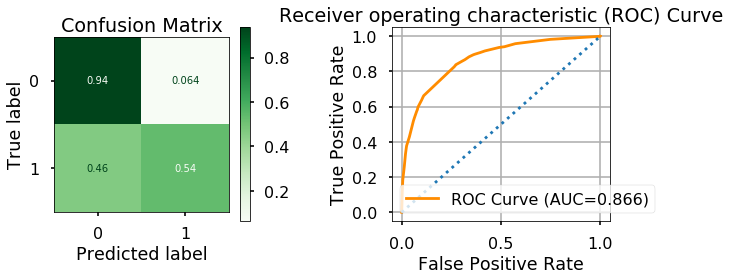

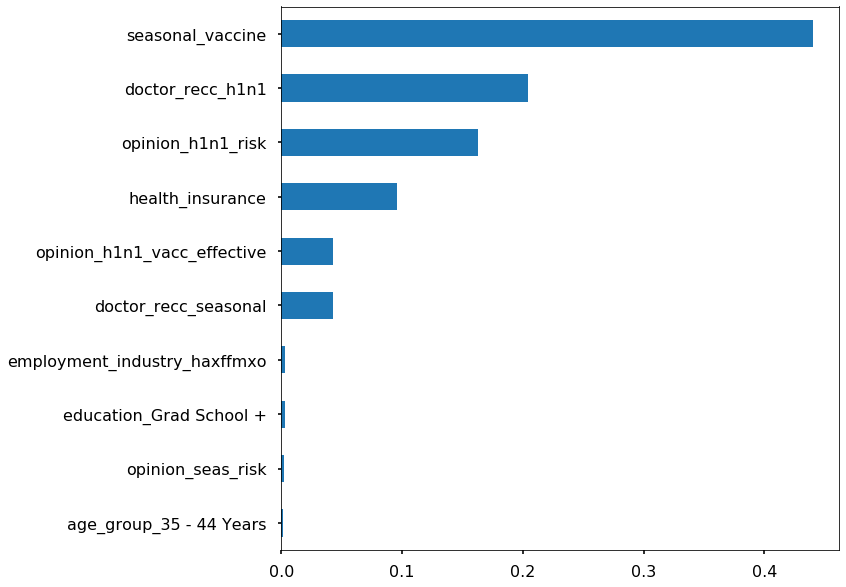

In [177]:
## Create a tree with the gridsearch's best params
best_tree = DecisionTreeClassifier(**grid_clf.best_params_)
best_tree.fit(X_train,y_train)

## Get predictions for train and test
y_hat_test = best_tree.predict(X_test)
evaluate_model(y_test,y_hat_test,X_test,best_tree)

In [178]:
## Can also pull out best model as best_estimator_
best_model = grid_clf.best_estimator_
best_model

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=5, max_features=70, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### RandomizedSearchCV

In [179]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
## Set up param grid ( can use same as before)
tree = DecisionTreeClassifier()
## Set up param grid
param_grid = {'criterion':['gini','entropy'],
             'max_depth':[None, 5, 3, 10],
             'max_features':['auto','sqrt',3,5,10,30,70]}

## Instantiate GridSearchCV
random_clf = RandomizedSearchCV(tree,param_grid)#,n_iter=50)

In [180]:
## Start timer and fit search
timer = Timer()
timer.start()

random_clf.fit(X_train,y_train)
## Stop time and print best params
timer.stop()
random_clf.best_params_

[i] Timer started at04/28/20 - 01:36 PM
[i] Timer ended at 04/28/20 - 01:36 PM
- Total time = 0:00:04.627070


{'max_features': 30, 'max_depth': 5, 'criterion': 'entropy'}

              precision    recall  f1-score   support

           0       0.87      0.95      0.91      6122
           1       0.73      0.48      0.58      1674

    accuracy                           0.85      7796
   macro avg       0.80      0.71      0.74      7796
weighted avg       0.84      0.85      0.84      7796



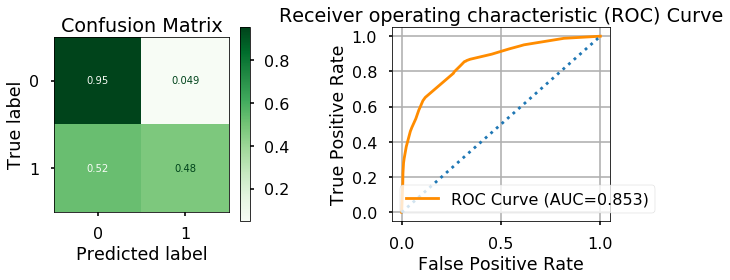

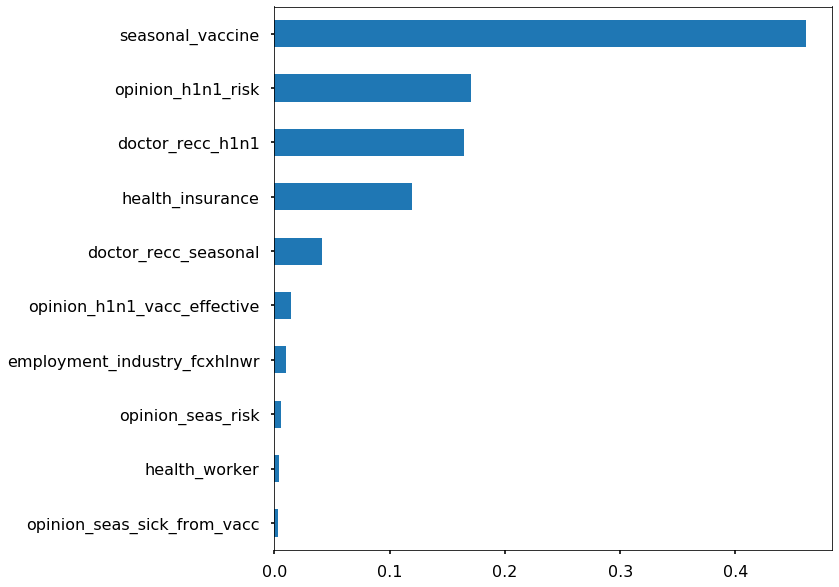

In [181]:
## Create a tree with the gridsearch's best params
best_tree= random_clf.best_estimator_
## Get predictions for train and test
## Get predictions for train and test
y_hat_test = best_tree.predict(X_test)
evaluate_model(y_test,y_hat_test,X_test,best_tree)

In [182]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
## Set up param grid ( can use same as before)
tree = DecisionTreeClassifier()
## Set up param grid
param_grid = {'criterion':['gini','entropy'],
             'max_depth':[None, 5, 3, 10],
             'max_features':['auto','sqrt',3,5,10,30,70]}

## Instantiate GridSearchCV
random_clf = RandomizedSearchCV(tree,param_grid,n_iter=50)

In [183]:
## Start timer and fit search
timer = Timer()
timer.start()

random_clf.fit(X_train,y_train)
## Stop time and print best params
timer.stop()
random_clf.best_params_

[i] Timer started at04/28/20 - 01:36 PM
[i] Timer ended at 04/28/20 - 01:37 PM
- Total time = 0:00:30.204038


{'max_features': 70, 'max_depth': 5, 'criterion': 'entropy'}

              precision    recall  f1-score   support

           0       0.87      0.96      0.91      6122
           1       0.78      0.46      0.58      1674

    accuracy                           0.86      7796
   macro avg       0.82      0.71      0.75      7796
weighted avg       0.85      0.86      0.84      7796



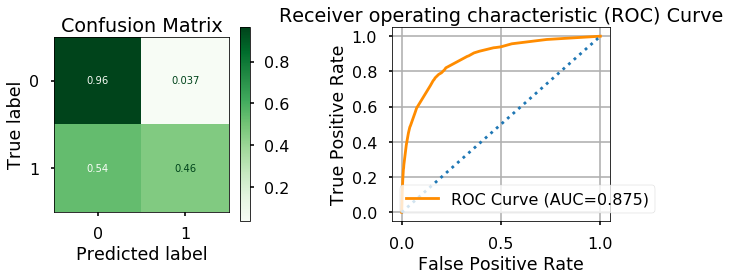

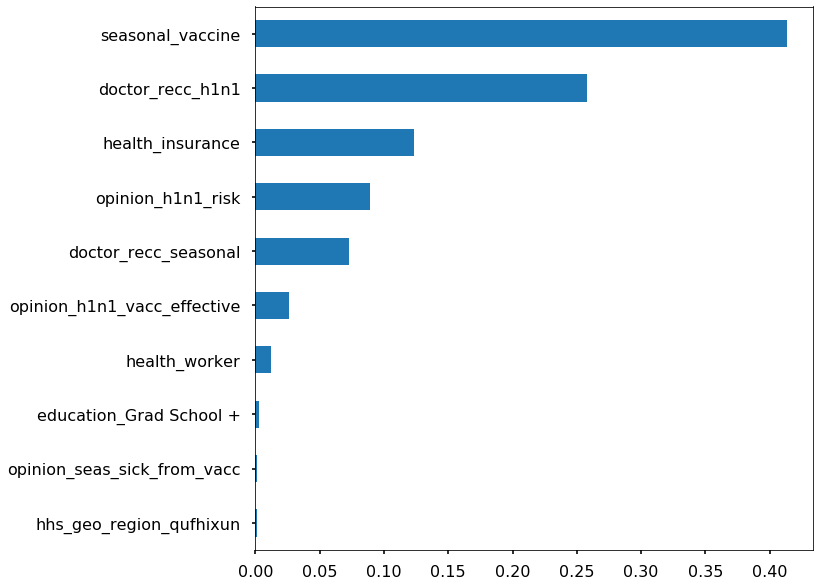

In [184]:
## Create a tree with the gridsearch's best params
best_tree= random_clf.best_estimator_
## Get predictions for train and test
## Get predictions for train and test
y_hat_test = best_tree.predict(X_test)
evaluate_model(y_test,y_hat_test,X_test,best_tree)

### Suport Vector Machines

In [185]:
#need to scale data, recommedns minmax
#soft margin allows for some mistakes
#want to tune C
#w = weights
#biases


In [186]:
# X = df_4.drop('h1n1_vaccine',axis=1).copy() #df_dummies_1.drop('h1n1_vaccine',axis=1).copy()
# y = df_4['h1n1_vaccine']

In [187]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [188]:
#gamma
#C
#smaller C leads to wider street, more violations

##kernal='poly', degree=3.7,C=C
#kernal='rbf', gamma=0.7,C=C
from sklearn.svm import SVC

model = SVC()
model.fit(X_train,y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [189]:
predictions = model.predict(X_test)

In [190]:
print(confusion_matrix(y_test, predictions))
print('/n')
print(classification_report(y_test, predictions))

[[5893  229]
 [ 817  857]]
/n
              precision    recall  f1-score   support

           0       0.88      0.96      0.92      6122
           1       0.79      0.51      0.62      1674

    accuracy                           0.87      7796
   macro avg       0.83      0.74      0.77      7796
weighted avg       0.86      0.87      0.85      7796



In [191]:
#search for best parameters using gridsearch

#gridsearch allows you to find right paramters, ie, whih C or gamma value to use
#takes in dictionary that describes the parameters that should be tried and model to train
#grid of paramters is a dictionary where keys are parmters and values are list of settings to be tested
from sklearn.model_selection import GridSearchCV

In [192]:
#C controls hte cost of misclassification on training data
#a large C value gives you low bias and high varaince. Low bias b/c you penalized the cost of misclassification a lot.
#smaller C value not going to penliaze misclassifcaion as much.-gives higher bias and lower variance.
#bias variance trade off
#gamma- radial basis function
#    small gamma means a gausian with large variance.  Large gamma leads to high bias and low varaince of model and visa versa.
#    if gamma is large and varaince is small implies Sv doesn't have a wide influence.
#C and gamma are paramters that ca nbe adjusted with a grid search
#creat param grid so sckitlearn can choose best value for you.

# 0.1, 1,10,100   1,0.1, 0.01,0.001
param_grid = {'C':[0.1,1,10, 100,1000], 'gamma':[1,0.1,0.01, 0.001, 0.0001]}

In [193]:
#verbose-higher the number teh 
#      text output of dexription of process.
#builds a new model w/new parameter setting

#grid = GridSearchCV(model, param_grid, verbose=3) #create gridearch object
#grid.fit(X_train, y_train)

In [194]:
#best paramters that have cross validation score
#grid.best_params_ 

In [195]:
#grid_predictions = grid.predict(X_test)

In [196]:
# print(confusion_matrix(y_test, grid_predictions))
# print('/n')
# print(classification_report(y_test, grid_predictions))

In [197]:
#sns.pairplot(df, hue='target', pallette='Dark2')
#separated 1 is going to be succesful class

In [198]:
#kds plot
# shot = iris[iris['species']== 'sestoa'#1] 
# sns.kdeplot(shot['width'], shot['sepal length'], cmap='plasma', shade=True, shade_lowest=False)

In [199]:
#from sklearn.preprocessing import StandardScaler
#smaller C, higher street
#higher C, smaller margin


# sc_x = standardScaler()
# X_std_train = sc_x.fit_transform(X_train)

# C= 1.0 #0.01
# clf = svm.SVC(kernel='linear',C=C)
# clf.fit(X_std_train, y_train)

In [200]:
# from sklearn.metrics import r2_score, mean_squared_error
# def make_model(model, X_train , X_test, y_train, y_test ):
#     """Takes a sklearn model and train/test data to fit model, 
#     get R2 and RMSE for both the training and test data.
    
#     Returns:
#         DataFrame: results as a df
#         model: fit scikit-learn model itself"""
    
#     res= [['Data','R2','RMSE']]
#     model.fit(X_train, y_train)
#     # Generate preditions for training and test sets
#     y_hat_train = model.predict(X_train)
#     y_hat_test = model.predict(X_test)
    
#     r2_train = r2_score(y_train,y_hat_train)
#     r2_test = r2_score(y_test,y_hat_test)
    
#     rmse_train = np.sqrt(mean_squared_error(y_train,y_hat_train))
#     rmse_test = np.sqrt(mean_squared_error(y_test,y_hat_test))
#     res.append(['Train', r2_train, rmse_train] )
#     res.append(['Test', r2_test, rmse_test] )
    
#     res_df = pd.DataFrame(res[1:], columns=res[0]).round(4)
    
#     return res_df, model
   
# df_res, model = make_model(LinearRegression(),
#                            X_train , X_test, y_train, y_test  )
# display(df_res.round(3))    

In [201]:
# df[['super_dist','release_type']] = df[['super_dist','release_type']].fillna('Missing')
#df['doctor_recc_seasonal'].fillna(df['doctor_recc_seasonal'].value_counts().index[0],inplace=True)
df_5 = df

NameError: name 'df' is not defined

In [ ]:
obj_cols.head(2)

In [ ]:
df.isnull().sum()

In [ ]:
data = pd.read_csv('h1n1_features.csv')
labels = pd.read_csv('h1n1_labels.csv')
df_data = pd.concat([data, labels], axis=1)
df_data.drop('respondent_id',axis=1, inplace=True)

In [ ]:
df_data.isna().sum()

In [ ]:
df_data_1 = df_data

In [ ]:
#marital_status 
#rent_or_own
#employment_status   
#df_data_1
print(df_data_1['marital_status'].value_counts(dropna=False))
print('/n')
print(df_data_1['rent_or_own'].value_counts(dropna=False))

In [ ]:
# df[['super_dist','release_type']] = df[['super_dist','release_type']].fillna('Missing')
#df['doctor_recc_seasonal'].fillna(df['doctor_recc_seasonal'].value_counts().index[0],inplace=True)
#df_data_1['marital_status','rent_or_own'] = df_data_1['marital_status','rent_or_own'].fillna(df_data_1['marital_status','rent_or_own'].value_counts().index[0],inplace=True)
cols = ['marital_status','rent_or_own']
df_data_1[cols]=df_data_1[cols].fillna(df_data_1.mode().iloc[0])

In [ ]:
print(df_data_1['marital_status'].value_counts(dropna=False))
print('/n')
print(df_data_1['rent_or_own'].value_counts(dropna=False))